# ECON 323 Project: Classification of smoking and non-smoking

##### Group member: Jun Gu (34124974), Keqing Wang (35503457), Xingyu Xian (46865887), Zhekai Zhu (29860764)

----------

## Introduction

Smoking is a significant lifestyle factor that impacts human health. The article discusses the systemic effects of smoking on various organs and systems in the human body, including the respiratory system, cardiovascular system, gastrointestinal system and immune system. Smoking has systemic effects on the entire body and can increase the risk of a wide range of diseases and health problems. Several health examination tests can be used to detect smoking effects on human body, such as lung function test, chest X-ray, and cancer screening tests. However, these tests are not commonly examined unless one experiences indisposed. Also the lengthy wait time and financial reason need to be considered. On the other hand, even though a health examination does not provide a comprehensive assessment, it is easier to conduct and cost-free. Through the mechanism of smoking-related harm to the body, the health examination can be used to predict whether one is a smoker to study potential health risks with smoking. 

* ### Health Effects of Smoking

Based on researches, the mechanism of smoking-related harm to the body is complex and multifaceted. Smoking involves inhaling a mixture of chemicals and toxins, which can lead to damage in various parts of the body.

Smoking also affects the cardiovascular system by increasing the risk of heart disease and stroke. Nicotine in cigarette smoke causes an increase in heart rate and blood pressure, while the chemicals in the smoke can damage the walls of the arteries and lead to the buildup of plaque, narrowing the arteries and restricting blood flow. This can cause an increase in blood pressure and heart rate, which can be reflected in higher systolic and diastolic blood pressure measurements.

Smoking can increase total cholesterol levels by damaging the walls of blood vessels, which can cause inflammation and the buildup of fatty deposits. Smoking can also decrease HDL cholesterol levels, which are important for removing excess cholesterol from the bloodstream. 

Smoking can increase insulin resistance, which in turn can lead to type 2 diabetes. Higher fasting blood sugar levels can be a sign of type 2 diabetes. 

Smoking is also associated with an increased risk of several types of cancer, including lung, throat, and mouth, leading to an increased risk of dental caries and tartar buildup. Smoking can increase the risk of developing type 2 diabetes, which can lead to higher fasting blood sugar levels.

* ### Target

我们要做什么model？ 目的是什么？ 现实生活中能有什么用？

Using the aforementioned mechanisms, we will predict whether an individual is a smoker based on their health parameters during a health examination. 




* ### Data and variables

介绍数据从哪来的？ 有哪些viariables? 哪个是我们要预测的variable?

To do so, we will analyze data from the National Health Insurance Service of Korea, which includes results from general health checkups of various groups, including national health insurance workers, dependents over 40 years of age, local subscribers who are household owners or over 40 years of age, as well as those who are eligible for general health checkups and have reached the ages of 40 and 66. The dataset is obtained from https://www.kaggle.com/datasets/kukuroo3/body-signal-of-smoking. 



介绍一下var 他们的normal range是多少 continuous 还是categorical 在data.txt里

## Methods

We will first wrangle the data. Once the data is processed, we will demonstrate its statistics by visualization. Based on the visualization results, we will pick explanatory variables that may be significant in the classification models. Three models will be built: logistics regression, decision tree, and random forest. We will then determine which is the best according to ROC and the predicted accuracy. 

重新写一下这个 这个是草稿

* ### Load packages

In [1]:
#load package
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn import (
    linear_model, metrics, neural_network, pipeline, preprocessing, model_selection
) #logistics
import plotly.express as px #piechart
import seaborn as sns #heatmap
%matplotlib inline


import warnings
warnings.filterwarnings("ignore")

解说接下来load data

* ### Load data

In [2]:
#load data
url = "https://raw.githubusercontent.com/JacksonZhuGithub/323_group_project/main/smoking.csv"
data = pd.read_csv(url)

#original data preview
data.head()

,ID,gender,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),...,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,oral,dental caries,tartar,smoking
0,0,F,40,155,60,81.3,1.2,1.0,1.0,1.0,...,12.9,1.0,0.7,18.0,19.0,27.0,Y,0,Y,0
1,1,F,40,160,60,81.0,0.8,0.6,1.0,1.0,...,12.7,1.0,0.6,22.0,19.0,18.0,Y,0,Y,0
2,2,M,55,170,60,80.0,0.8,0.8,1.0,1.0,...,15.8,1.0,1.0,21.0,16.0,22.0,Y,0,N,1
3,3,M,40,165,70,88.0,1.5,1.5,1.0,1.0,...,14.7,1.0,1.0,19.0,26.0,18.0,Y,0,Y,0
4,4,F,40,155,60,86.0,1.0,1.0,1.0,1.0,...,12.5,1.0,0.6,16.0,14.0,22.0,Y,0,N,0


In [3]:
#data shape
data.shape

(55692, 27)

解说一下几行几列 注意提到这是原始数据

* ### Wrangling and cleaning data

引言，让我们看看data信息

In [4]:
#data information
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55692 entries, 0 to 55691
Data columns (total 27 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   55692 non-null  int64  
 1   gender               55692 non-null  object 
 2   age                  55692 non-null  int64  
 3   height(cm)           55692 non-null  int64  
 4   weight(kg)           55692 non-null  int64  
 5   waist(cm)            55692 non-null  float64
 6   eyesight(left)       55692 non-null  float64
 7   eyesight(right)      55692 non-null  float64
 8   hearing(left)        55692 non-null  float64
 9   hearing(right)       55692 non-null  float64
 10  systolic             55692 non-null  float64
 11  relaxation           55692 non-null  float64
 12  fasting blood sugar  55692 non-null  float64
 13  Cholesterol          55692 non-null  float64
 14  triglyceride         55692 non-null  float64
 15  HDL                  55692 non-null 

讲讲我们下一步计划怎么处理数据：

去掉"height(cm)","weight(kg)","waist(cm)","hearing(left)","hearing(right)"，"ID" ---》此处去掉6列  （合理解释）

视力求平均值， 然后去掉原左右视力两列 ---》此处加一列，去掉两列 （解释）

---》共去掉7列 应剩20列

In [5]:
#drop columns 'height(cm)', 'weight(kg)', 'waist(cm)', 'hearing(left)', 'hearing(right)', 'oral'
data.drop(["height(cm)","weight(kg)","waist(cm)","hearing(left)","hearing(right)","ID","oral"], axis = 1, inplace = True)

#add a new column called 'eyesight', which indicating the mean eyesight, remove 'eyesight(left)' and 'eyesight(right)'
data['mean_eyesight']=(data['eyesight(left)']+data['eyesight(right)'])/2
data.drop(["eyesight(left)","eyesight(right)"], axis = 1, inplace = True)

In [6]:
data.head()

,gender,age,systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,tartar,smoking,mean_eyesight
0,F,40,114.0,73.0,94.0,215.0,82.0,73.0,126.0,12.9,1.0,0.7,18.0,19.0,27.0,0,Y,0,1.1
1,F,40,119.0,70.0,130.0,192.0,115.0,42.0,127.0,12.7,1.0,0.6,22.0,19.0,18.0,0,Y,0,0.7
2,M,55,138.0,86.0,89.0,242.0,182.0,55.0,151.0,15.8,1.0,1.0,21.0,16.0,22.0,0,N,1,0.8
3,M,40,100.0,60.0,96.0,322.0,254.0,45.0,226.0,14.7,1.0,1.0,19.0,26.0,18.0,0,Y,0,1.5
4,F,40,120.0,74.0,80.0,184.0,74.0,62.0,107.0,12.5,1.0,0.6,16.0,14.0,22.0,0,N,0,1.0


In [7]:
data.shape

(55692, 19)

20列，正确

接下来把‘smoking’的0和1 换成 “N”“Y” （解释0,1代表什么，再解释N Y代表什么）

把‘smoking’放置最后一列 （为了方便看）

In [8]:
#convert smoking status 0 and 1 to string
data['smoking'] = data['smoking'].astype(str)

#smoking status: Y: smoker N:non-smoker
data['smoking'] = data['smoking'].str.replace('1','Y')
data['smoking'] = data['smoking'].str.replace('0','N')

#make 'smoking' be the last column
smoking_col=data.pop('smoking')
data['smoking']=smoking_col

In [9]:
#final data preview
data.head()

,gender,age,systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,tartar,mean_eyesight,smoking
0,F,40,114.0,73.0,94.0,215.0,82.0,73.0,126.0,12.9,1.0,0.7,18.0,19.0,27.0,0,Y,1.1,N
1,F,40,119.0,70.0,130.0,192.0,115.0,42.0,127.0,12.7,1.0,0.6,22.0,19.0,18.0,0,Y,0.7,N
2,M,55,138.0,86.0,89.0,242.0,182.0,55.0,151.0,15.8,1.0,1.0,21.0,16.0,22.0,0,N,0.8,Y
3,M,40,100.0,60.0,96.0,322.0,254.0,45.0,226.0,14.7,1.0,1.0,19.0,26.0,18.0,0,Y,1.5,N
4,F,40,120.0,74.0,80.0,184.0,74.0,62.0,107.0,12.5,1.0,0.6,16.0,14.0,22.0,0,N,1.0,N


查看有无empty value

In [10]:
data.isna().sum()

gender                 0
age                    0
systolic               0
relaxation             0
fasting blood sugar    0
Cholesterol            0
triglyceride           0
HDL                    0
LDL                    0
hemoglobin             0
Urine protein          0
serum creatinine       0
AST                    0
ALT                    0
Gtp                    0
dental caries          0
tartar                 0
mean_eyesight          0
smoking                0
dtype: int64

好，可以下一步，对数据进行基本的可视化

* ### Exploratory Data Analysis

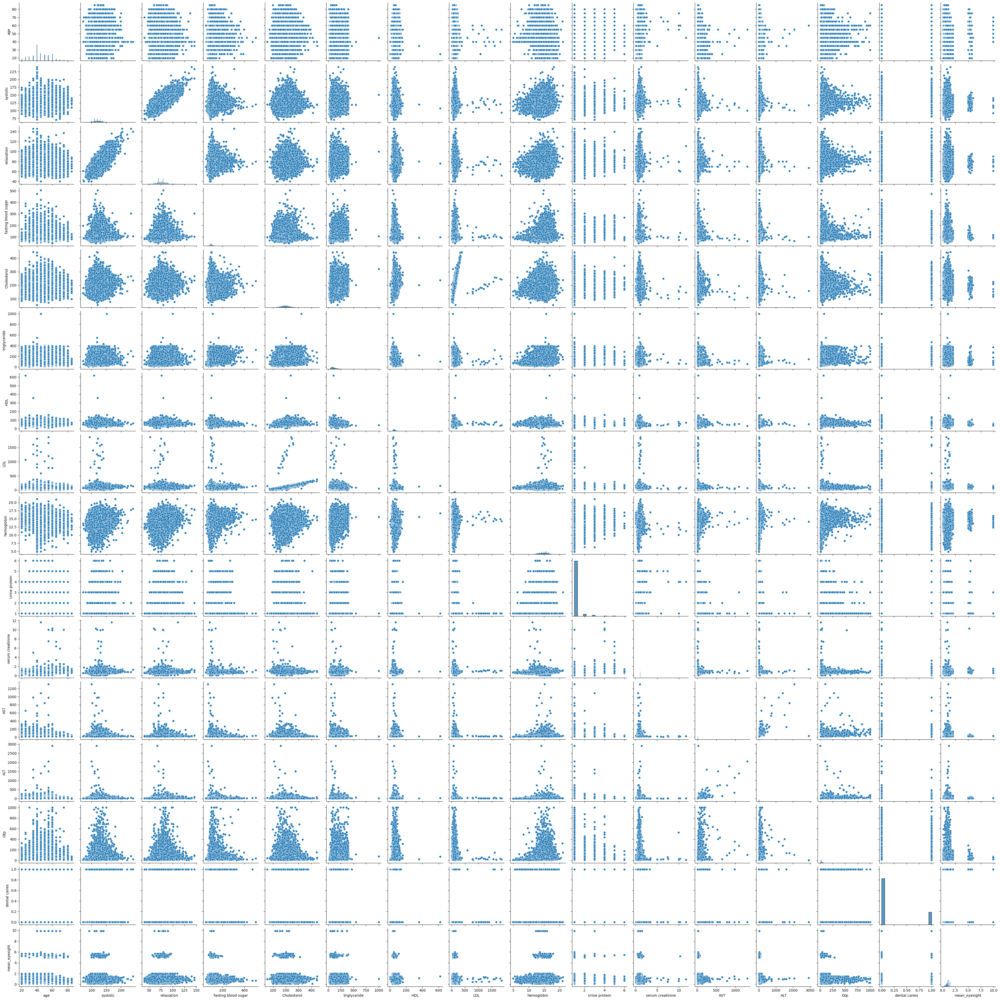

In [11]:
sns.pairplot(data.drop('smoking', axis = 1))

首先只看抽烟的比例

([<matplotlib.patches.Wedge at 0x7f58bdb7c3d0>,
 [Text(-0.4454481244299395, 1.0057713300953897, 'Non-smoke'),
  Text(0.5061910504885672, -1.1429219660174885, 'Smoke')],
 [Text(-0.24297170423451242, 0.5486025436883943, '63.271%'),
  Text(0.3037146302931403, -0.6857531796104931, '36.729%')])

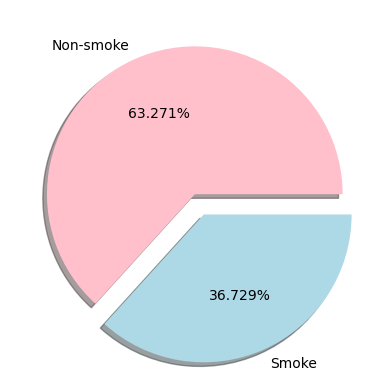

In [12]:
###smoking proportion
#------------------------------
#count the number of female and  male
smoking_count=data['smoking'].value_counts()

fig, ax=plt.subplots()
ax.pie(smoking_count,labels=['Non-smoke','Smoke'],autopct='%.3f%%',shadow=True,explode = [0, 0.15],colors=["pink","lightblue"])

说明一下

接下来看男女比例

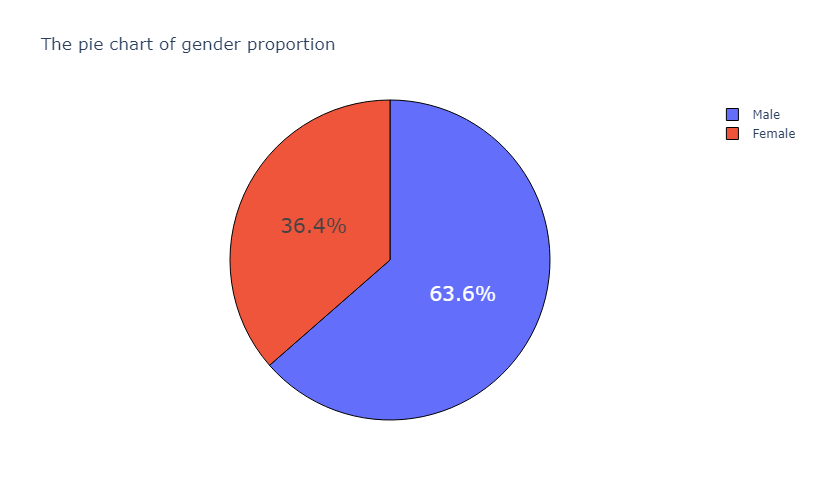

In [13]:
###gender proportion
#--------------------------------------------------
gender_count_df = {'gender': ["Male", "Female"], 'count': [35401, 20291]}
gender_count_df = pd.DataFrame(data=gender_count_df)

fig = px.pie(gender_count_df,
             values='count',
             names='gender', 
             title='The pie chart of gender proportion',
             width=1000, height=500)

fig.update_traces(hoverinfo='label+percent', textfont_size=20,
                  marker=dict(line=dict(color='#000000', width=1)))

说明

接下来研究年龄：年龄分布，抽烟和年龄的Boxplot（把年龄按中位数分为二份）

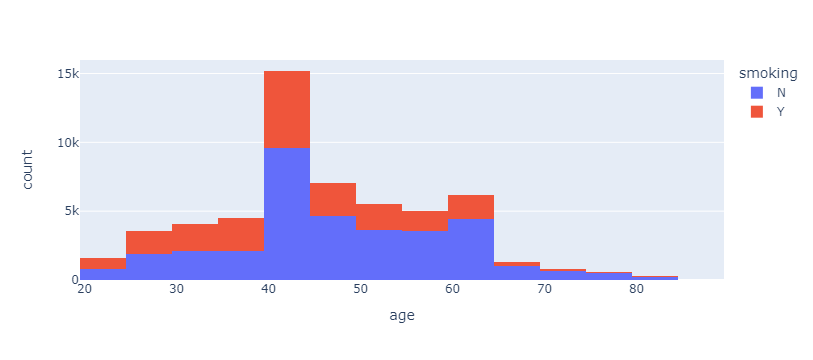

In [14]:
import plotly.express as px

fig = px.histogram(data, x="age", color = "smoking")
fig.show()

解释说明

接下来看抽烟与否对‘systolic’（心脏收缩压），和relaxation（舒张压）的有没有影响

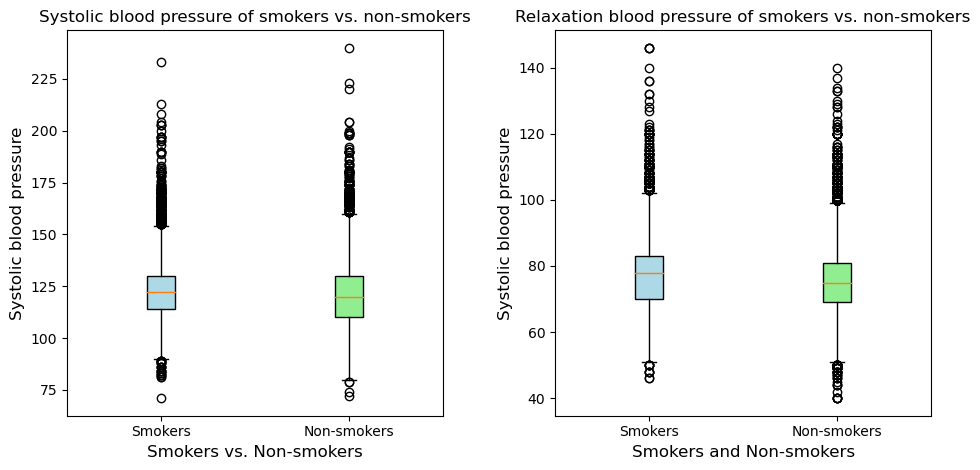

In [15]:
###systolic
#--------------------------------------------------
#select column "systolic", and column "smoiking"
systolic_smoke = data.loc[(data['smoking'] == "Y")]["systolic"]
systolic_non_smoke=data.loc[(data['smoking'] == "N")]["systolic"]

#select column "relaxation", and column "smoiking"
relaxation_smoke = data.loc[(data['smoking'] == "Y")]["relaxation"]
relaxation_non_smoke=data.loc[(data['smoking'] == "N")]["relaxation"]

#plot systolic
fig, ax=plt.subplots(1,2)
boxplot_systolic=ax[0].boxplot(x=[systolic_smoke,systolic_non_smoke],
                               labels=["Smokers","Non-smokers"],
                               patch_artist=True)

colors = ['lightblue', 'lightgreen']
for patch, color in zip(boxplot_systolic['boxes'], colors):
    patch.set_facecolor(color)

ax[0].set_title("Systolic blood pressure of smokers vs. non-smokers",fontsize=12)
ax[0].set_ylabel("Systolic blood pressure",fontsize=12)
ax[0].set_xlabel("Smokers vs. Non-smokers",fontsize=12)

#plot relaxation
boxplot_relaxation=ax[1].boxplot(x=[relaxation_smoke,relaxation_non_smoke],
                               labels=["Smokers","Non-smokers"],
                               patch_artist=True)

colors = ['lightblue', 'lightgreen']
for patch, color in zip(boxplot_relaxation['boxes'], colors):
    patch.set_facecolor(color)

ax[1].set_title("Relaxation blood pressure of smokers vs. non-smokers",fontsize=12)
ax[1].set_ylabel("Systolic blood pressure",fontsize=12)
ax[1].set_xlabel("Smokers and Non-smokers",fontsize=12)

fig.tight_layout()
fig.set_figwidth(10,2)

解说：对比之前variable里写的normal range 看看这里的正不正常 抽烟有没有影响 因为这个range本来差得就不大 要仔细看

对比抽不抽烟对tartar的影响

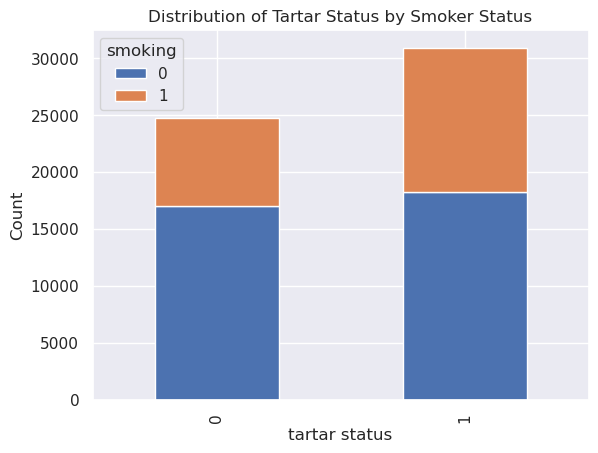

In [54]:
import seaborn as sns

sns.set()

# Create a crosstab of tartar status and smoker status
ct = pd.crosstab(data['tartar'], data['smoking'])

# Create a stacked bar chart
ct.plot(kind='bar', stacked=True)

# Add labels and title
plt.xlabel('tartar status')
plt.ylabel('Count')
plt.title('Distribution of Tartar Status by Smoker Status')

plt.show()


解释一下这个图 



接下来画空腹血糖：outliers会压缩图片，导致看不清，所以移除Outliers.

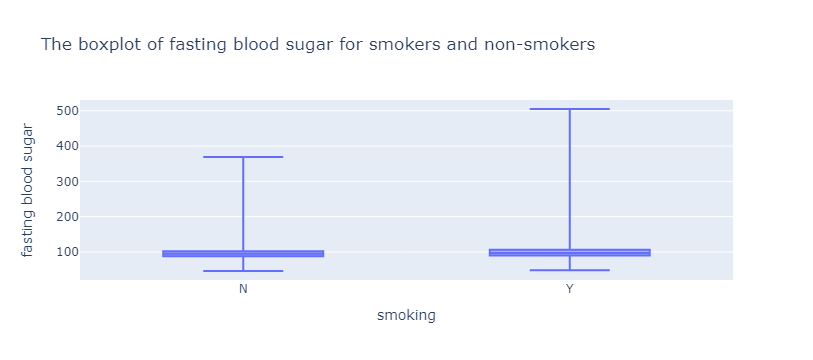

In [17]:
###fasting blood sugar
fig = px.box(data, x="smoking", y="fasting blood sugar",
             points=False,
             title="The boxplot of fasting blood sugar for smokers and non-smokers")
fig.show()

解说：对比之前variable里写的normal range 看看这里的正不正常 抽烟有没有影响

剩下的看起来都很有关，所以不单独画图分析，直接用heat-map代替， 除了视力。所以现在画视力

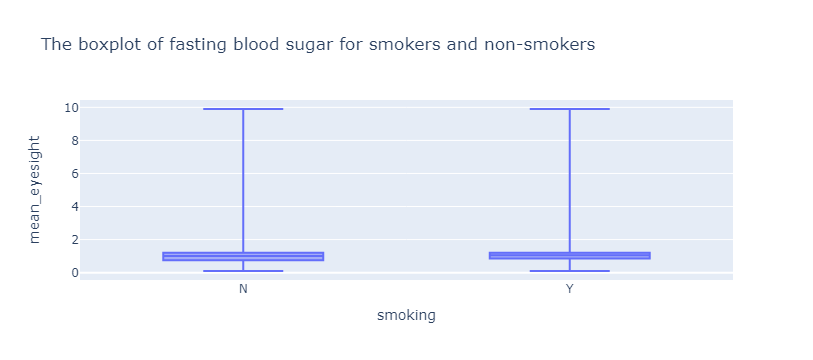

In [18]:
fig = px.box(data, x="smoking", y="mean_eyesight",
             points=False,
             title="The boxplot of fasting blood sugar for smokers and non-smokers")
fig.show()

没什么用，移除视力 原因：图看不出东西，且视力受其他方面影响更大。吸烟也许只是很小一部分原因。

In [19]:
#remove 'mean_eyesight' column
data.drop(['mean_eyesight'], axis = 1, inplace = True)

#final data
data.head()

,gender,age,systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,tartar,smoking
0,F,40,114.0,73.0,94.0,215.0,82.0,73.0,126.0,12.9,1.0,0.7,18.0,19.0,27.0,0,Y,N
1,F,40,119.0,70.0,130.0,192.0,115.0,42.0,127.0,12.7,1.0,0.6,22.0,19.0,18.0,0,Y,N
2,M,55,138.0,86.0,89.0,242.0,182.0,55.0,151.0,15.8,1.0,1.0,21.0,16.0,22.0,0,N,Y
3,M,40,100.0,60.0,96.0,322.0,254.0,45.0,226.0,14.7,1.0,1.0,19.0,26.0,18.0,0,Y,N
4,F,40,120.0,74.0,80.0,184.0,74.0,62.0,107.0,12.5,1.0,0.6,16.0,14.0,22.0,0,N,N


In [20]:
data.shape

(55692, 18)

19列正确 开始做heatmap

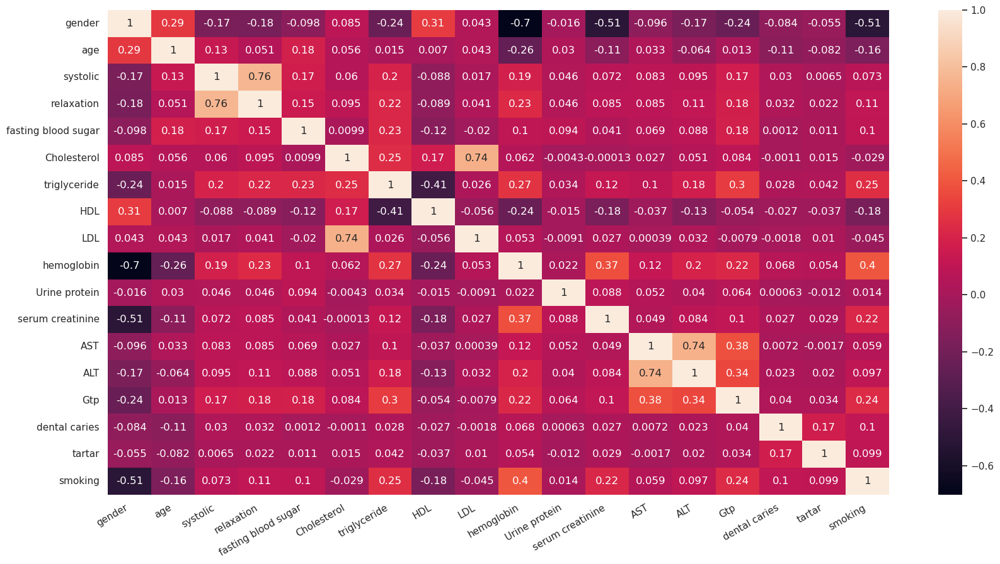

In [21]:
#dataframe with all variables in numbers
data_num=data

#smoking status change back to 0 1 for making heat map
data_num['smoking'] = data_num['smoking'].str.replace('Y','1')
data_num['smoking'] = data_num['smoking'].str.replace('N','0')
data_num['smoking'] = data_num['smoking'].astype(int)

#genger change to 0 1 for making heat map
data_num['gender'] = data_num['gender'].str.replace('M','0')
data_num['gender'] = data_num['gender'].str.replace('F','1')
data_num['gender'] = data_num['gender'].astype(int)

#tartar change to 0 1 for making heat map
data_num['tartar'] = data_num['tartar'].str.replace('Y','1')
data_num['tartar'] = data_num['tartar'].str.replace('N','0')
data_num['tartar'] = data_num['tartar'].astype(int)



#heatmap
plt.figure(figsize=(20,10))
heat_map=sns.heatmap(data_num.corr(),annot=True)
plt.xticks(rotation=30, ha='right');

解释一下 哪些是pos corr哪些neg 哪些关系比较大 总结

* ### Model Fitting (Classification based on Logistics Regression)

开始做model

首先分为train test

In [22]:
#training data and testing data, random_state=323 for reproducible
train = data_num.sample(frac = 0.75,random_state = 323) 
test = data_num.drop(train.index)

#X_train, y_train, X_test, y_test
X_train=train.drop(['smoking'],axis=1)
y_train=train["smoking"]

X_test=test.drop(['smoking'],axis=1)
y_test=test["smoking"]

#shape
print(f"Shape of training data X: {X_train.shape}")
print(f"Shape of testing data y: {y_train.shape}")
print(f"Shape of training data X: {X_test.shape}")
print(f"Shape of training data y: {y_test.shape}")

Shape of training data X: (41769, 17)
Shape of testing data y: (41769,)
Shape of training data X: (13923, 17)
Shape of training data y: (13923,)


解说

In [23]:
#logistics regression
logistic_model = linear_model.LogisticRegression(solver="lbfgs")
logistic_model.fit(X_train, y_train)

LogisticRegression()

In [24]:
#accuracy
train_acc = logistic_model.score(X_train, y_train)
test_acc = logistic_model.score(X_test, y_test)

print(f"The accuracy for Training data is: {train_acc}")
print(f"The accuracy for Testing data is: {test_acc}")

The accuracy for Training data is: 0.7360722066604419
The accuracy for Testing data is: 0.7359764418587948


解释 我们对比几个model都是看这个accuracy 对比train和test可以看出是否overfit什么的 可以搜一下然后解释

接下来画ROC

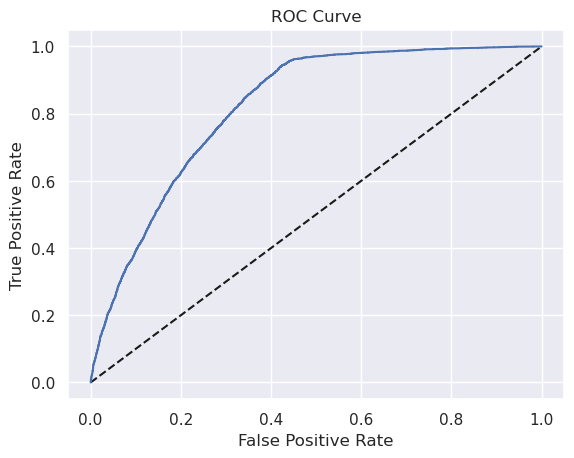

In [25]:
#ROC
def plot_roc(mod, X, y):
    # predicted_probs is an N x 2 array, where N is number of observations
    # and 2 is number of classes
    predicted_probs = mod.predict_proba(X_test)

    # keep the second column, for label=1
    predicted_prob1 = predicted_probs[:, 1]

    fpr, tpr, _ = metrics.roc_curve(y_test, predicted_prob1)

    # Plot ROC curve
    fig, ax = plt.subplots()
    ax.plot([0, 1], [0, 1], "k--")
    ax.plot(fpr, tpr)
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.set_title("ROC Curve")

plot_roc(logistic_model, X_test, y_test)

解释

* ### Model Fitting (Classification based on Decision Tree)

In [26]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split 
from sklearn import metrics 

- $X$ &rarr; Feature vectors
- $y$ &rarr; Target
解释一下我们的x和y是什么

Now we fit tree model 1 with default: `max_depth`=none. If the max depth is none, then nodes are expanded until all the leaves contain less than min_samples_split samples. 

In [27]:
tree_model1 = DecisionTreeClassifier() # Create a decision tree
tree_model1.fit(X_train, y_train) # Fit a decision tree
y_pred = tree_model1.predict(X_test) #Predict the response for test datas
print (tree_model1.score(X_train, y_train))
print(tree_model1.score(X_test, y_test))
print("Accuracy:",metrics.accuracy_score(y_test, y_pred) ,"with depth=", tree_model1.get_depth())

1.0
0.7745457157221863
Accuracy: 0.7745457157221863 with depth= 33


解释 我们对比几个model都是看这个accuracy 还有 对比train和test可以看出是否overfit什么的 可以搜一下然后解释

Now generate a for loop to find the optimal max depth for criterion="entropy"

In [28]:
list=[]
for i in range (1,50):
    tree_model2 = DecisionTreeClassifier(criterion="entropy",max_depth=i) # Create a decision tree
    tree_model2.fit(X_train, y_train) # Fit a decision tree
    y_pred = tree_model2.predict(X_test) #Predict the response for test dataset
    acc=metrics.accuracy_score(y_test, y_pred) #evaluate the model
    list.append(acc)
  
n = list.index(max(list))  #find the optimal max_depth
print(f"the optimal max depth is {n} with accuracy of {max(list)}.")


the optimal max depth is 35 with accuracy of 0.7813689578395461.


In [29]:
tree_model2 = DecisionTreeClassifier(criterion="entropy",max_depth=n)
tree_model2.fit(X_train, y_train) # Fit a decision tree
y_pred = tree_model2.predict(X_test) #Predict the response for test datas
print (tree_model2.score(X_train, y_train))
print(tree_model2.score(X_test, y_test))

1.0
0.7767004237592473


解释 我们对比几个model都是看这个accuracy 还有 对比train和test可以看出是否overfit什么的 可以搜一下然后解释

Now generate a for loop to find the optimal max depth for the default criterion

In [30]:
list=[]
for i in range (1,50):
    tree_model3 = DecisionTreeClassifier(max_depth=i) # Create a decision tree
    tree_model3.fit(X_train, y_train) # Fit a decision tree
    y_pred = tree_model3.predict(X_test) #Predict the response for test dataset
    acc=metrics.accuracy_score(y_test, y_pred) #evaluate the model
    list.append(acc)
  
m = list.index(max(list))  #find the optimal max_depth
print(f"the optimal max depth is {m} with accuracy of {max(list)}.")


the optimal max depth is 48 with accuracy of 0.7779932485814839.


解释 我们对比几个model都是看这个accuracy 还有 对比train和test可以看出是否overfit什么的 可以搜一下然后解释

对比一下这三个tree model （第一个default max depth=none 第二个for loop是找entropy的optimal max depth 第三个是for loop是找gini的optimal max depth）

accurcy相差不大 选max depth最少那个 解释原因 接下来这个是我们最终选择的tree model
The accuracy does not change much. Hence we choose the lowest max depth to prevent overfitting which is:

In [31]:
tree_model = DecisionTreeClassifier(max_depth=m) # Create a decision tree
tree_model.fit(X_train, y_train) # Fit a decision tree
y_pred = tree_model.predict(X_test) #Predict the response for test datas
print (tree_model.score(X_train, y_train))
print(tree_model.score(X_test, y_test))
print("Accuracy:",metrics.accuracy_score(y_test, y_pred) ,"with depth=", tree_model1.get_depth())

1.0
0.7741865977160095
Accuracy: 0.7741865977160095 with depth= 33


看一下feature哪些对tree model比较重要 解释一下

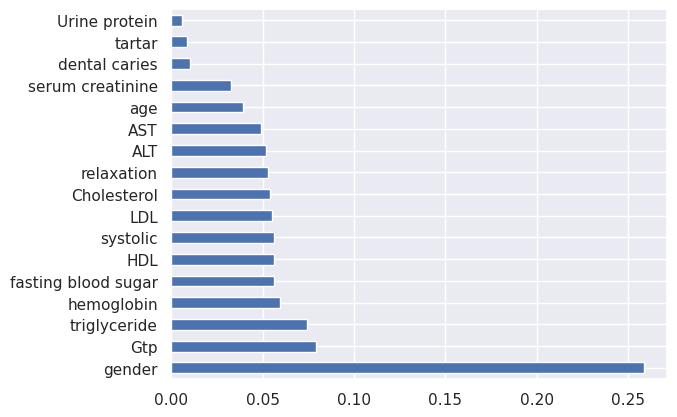

In [32]:
feat_importances = pd.Series(tree_model.feature_importances_, index=X_train.columns)
feat_importances.nlargest(20).plot(kind='barh')
plt.show()

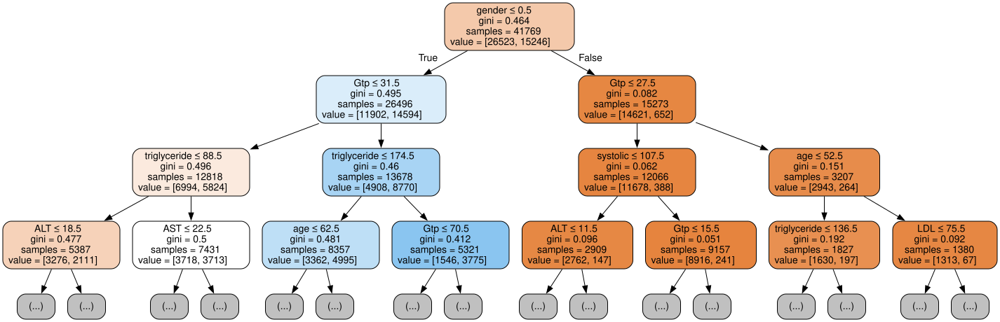

In [51]:
import graphviz

tree_graph = export_graphviz(tree_model, out_file=None,
                                  feature_names=X_train.columns,
                                  filled=True, rounded=True,
                                  max_depth=3,
                                  special_characters=True)
display(graphviz.Source(tree_graph))

## Random Forest

In [34]:
# Data Processing
import pandas as pd
import numpy as np

# Modelling
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from scipy.stats import randint

# Tree Visualisation
from sklearn.tree import export_graphviz
from IPython.display import Image
import graphviz

In [35]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)

RandomForestClassifier()

In [36]:
y_pred = rf_model.predict(X_test)

In [37]:
print (rf_model.score(X_train, y_train))
print(rf_model.score(X_test, y_test))

0.9999760587995882
0.8263305322128851


In [38]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.8263305322128851


这个数据比较好

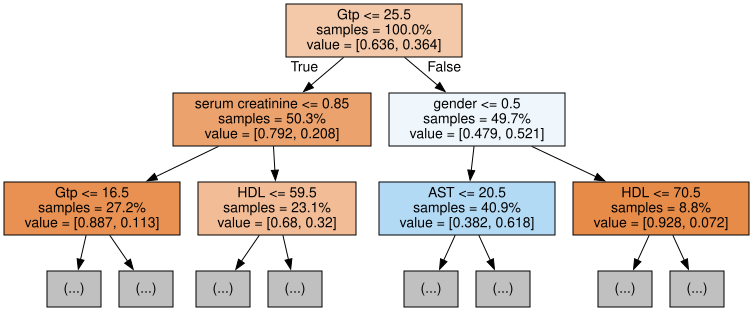

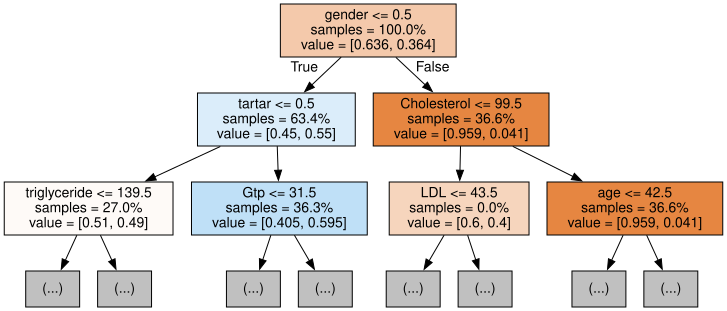

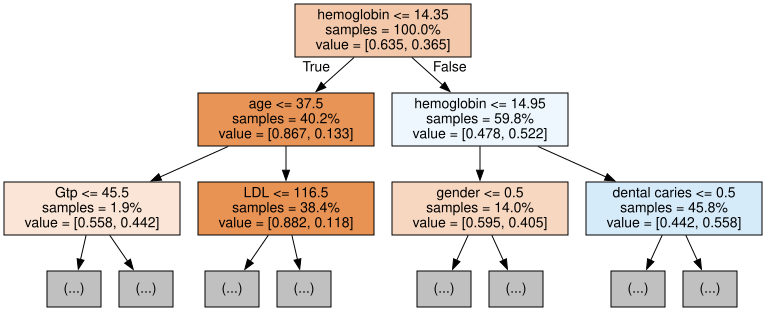

In [46]:
# Export the first three decision trees from the forest

for i in range(3):
    rf = rf_model.estimators_[i]
    dot_data = export_graphviz(rf,
                               feature_names=X_train.columns,  
                               filled=True,  
                                max_depth=2,
                               impurity=False, 
                               proportion=True)
    graph = graphviz.Source(dot_data)
    display(graph)

现在找最好的hyperparameyer
解释一下为什么要找 原理

In [56]:
param_dist = {'n_estimators': randint(50,500),
              'max_depth': randint(1,20)}

# Create a random forest classifier
rf_model = RandomForestClassifier()

# Use random search to find the best hyperparameters
rand_search = RandomizedSearchCV(rf_model, 
                                 param_distributions = param_dist, 
                                 n_iter=5, 
                                 cv=5)

# Fit the random search object to the data
rand_search.fit(X_train, y_train)

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_iter=5,
                   param_distributions={'max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7f58b2a5b370>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7f58b34bc6d0>})

In [57]:
# Create a variable for the best model
best_rf = rand_search.best_estimator_
print('Best hyperparameters:',  rand_search.best_params_)

Best hyperparameters: {'max_depth': 19, 'n_estimators': 496}


这是function找到的最好的
现在看看score和accuracy怎么样 还是跟之前一样对比一下 然后看看有没有overfit什么的

0.9952596423184659
0.8279824750412985
Accuracy: 0.8279824750412985


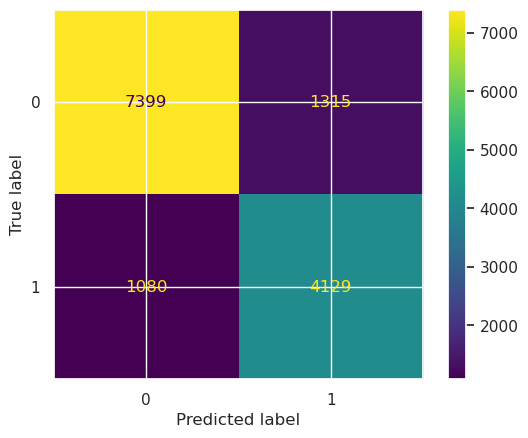

In [58]:
# Generate predictions with the best model
y_pred = best_rf.predict(X_test)
print (best_rf.score(X_train, y_train))
print(best_rf.score(X_test, y_test))
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Create the confusion matrix
cm = confusion_matrix(y_test, y_pred)

ConfusionMatrixDisplay(confusion_matrix=cm).plot();

解释一下这个matrix

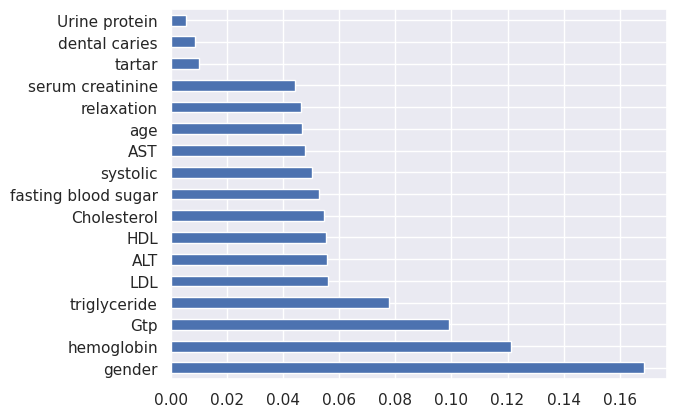

In [59]:
# feature importances from the model 
feature_importances = pd.Series(best_rf.feature_importances_, index=X_train.columns).sort_values(ascending=False)
feature_importances.plot.barh();

best random forest的feature哪些重要 大概说一下 跟之前那个对比一下

## Results

based on accuracy数据什么的， 得出最好的model是哪个 

## Disccussion

## Limitation

* Smoking status does not include e-cigarettes.
写一下有什么限制 
一个是体检的health paramter不多 不能太体现抽烟的影响所以预测不一定准
一个是这个抽烟不包括抽电子烟 所以会有误差 可以解释一下电子烟对人体的危害 或者电子烟跟真烟的区别
一个是可以追查同一组人抽烟的 和不抽烟的 每年身体的数据 这样能得出更好的model

------------------------------

## References

在data.txt里 上面那个mechanism是based on一个paper cite一下 然后variable那个normal range愿意的话也可以cite 都在data.txt